In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df_esea1 = pd.read_csv('esea_master_dmg_demos.part1.csv')
df_esea2 = pd.read_csv('esea_master_dmg_demos.part2.csv')
df_esea3 = pd.concat([df_esea1, df_esea2])

In [3]:
df_esea3

,file,round,tick,seconds,att_team,vic_team,att_side,vic_side,hp_dmg,arm_dmg,...,wp,wp_type,att_id,att_rank,vic_id,vic_rank,att_pos_x,att_pos_y,vic_pos_x,vic_pos_y
0,esea_match_13770997.dem,1,14372,111.8476,World,Animal Style,None,CounterTerrorist,1,0,...,Unknown,Unkown,0,0,76561198055054795,0,0.0000,0.00000,0.0000,0.000000
1,esea_match_13770997.dem,1,15972,124.3761,Animal Style,Hentai Hooligans,CounterTerrorist,Terrorist,18,9,...,USP,Pistol,76561198048742997,0,76561198082200410,0,-1499.6900,63.33829,-669.5558,-79.769570
2,esea_match_13770997.dem,1,16058,125.0495,Animal Style,Hentai Hooligans,CounterTerrorist,Terrorist,100,0,...,USP,Pistol,76561198055054795,0,76561197961009213,0,-1066.8740,3.44563,-614.1868,-91.707770
3,esea_match_13770997.dem,1,16066,125.1121,Hentai Hooligans,Animal Style,Terrorist,CounterTerrorist,12,7,...,Glock,Pistol,76561198082200410,0,76561198055054795,0,-747.3146,-49.32681,-1065.5560,9.381622
4,esea_match_13770997.dem,1,16108,125.4410,Animal Style,Hentai Hooligans,CounterTerrorist,Terrorist,15,7,...,USP,Pistol,76561198048742997,0,76561198082200410,0,-1501.8610,49.19798,-748.4188,-53.469220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4546080,esea_match_13829173.dem,22,243361,1901.4210,Team 1,Team 2,Terrorist,CounterTerrorist,20,2,...,AK47,Rifle,76561197986109746,0,76561198047370175,0,-1132.0250,-191.14730,-1220.2790,-1279.492000
4546081,esea_match_13829173.dem,22,243373,1901.5150,Team 1,Team 2,Terrorist,CounterTerrorist,26,3,...,AK47,Rifle,76561197986109746,0,76561198047370175,0,-1132.0250,-191.14730,-1218.2490,-1275.254000
4546082,esea_match_13829173.dem,22,243405,1901.7650,Team 2,Team 1,CounterTerrorist,Terrorist,100,15,...,AK47,Rifle,76561198047370175,0,76561197986109746,0,-1205.9710,-1271.50400,-1132.0250,-191.147300
4546083,esea_match_13829173.dem,22,243719,1904.2230,Team 2,Team 1,CounterTerrorist,Terrorist,27,4,...,AK47,Rifle,76561198047370175,0,76561198103856560,0,-1217.5950,-1091.54300,-1373.8790,-931.702600


In [4]:
df_esea_meta1 = pd.read_csv('esea_meta_demos.part1.csv')
df_esea_meta2 = pd.read_csv('esea_meta_demos.part2.csv')
df_esea_meta = pd.concat([df_esea_meta1, df_esea_meta2])

In [5]:
df_esea_meta

,file,map,round,start_seconds,end_seconds,winner_team,winner_side,round_type,ct_eq_val,t_eq_val
0,esea_match_13770997.dem,de_overpass,1,94.30782,160.9591,Hentai Hooligans,Terrorist,PISTOL_ROUND,4300,4250
1,esea_match_13770997.dem,de_overpass,2,160.95910,279.3998,Hentai Hooligans,Terrorist,ECO,6300,19400
2,esea_match_13770997.dem,de_overpass,3,279.39980,341.0084,Hentai Hooligans,Terrorist,SEMI_ECO,7650,19250
3,esea_match_13770997.dem,de_overpass,4,341.00840,435.4259,Hentai Hooligans,Terrorist,NORMAL,24900,23400
4,esea_match_13770997.dem,de_overpass,5,435.42590,484.2398,Animal Style,CounterTerrorist,ECO,5400,20550
...,...,...,...,...,...,...,...,...,...,...
161705,esea_match_13829173.dem,de_mirage,18,1647.20600,1694.6550,Team 1,Terrorist,ECO,4500,21950
161706,esea_match_13829173.dem,de_mirage,19,1694.65500,1753.4380,Team 1,Terrorist,NORMAL,16400,26100
161707,esea_match_13829173.dem,de_mirage,20,1753.43800,1803.6580,Team 1,Terrorist,FORCE_BUY,15100,26000
161708,esea_match_13829173.dem,de_mirage,21,1803.65800,1856.0850,Team 1,Terrorist,NORMAL,17550,25500


In [6]:
df_esea_meta['roundtime'] = df_esea_meta['end_seconds'] - df_esea_meta['start_seconds']
df_esea_meta = df_esea_meta.set_index(['file','round'])

<AxesSubplot:>

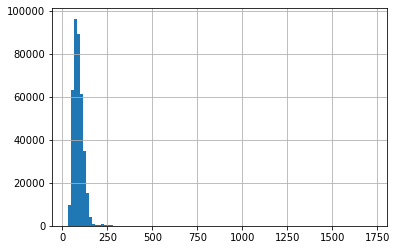

In [7]:
df_esea_meta['roundtime'].hist(bins = 100)

In [9]:
df_esea = df_esea3.set_index(['file','round']).join(df_esea_meta, how ='inner')
df_esea = df_esea[(df_esea['roundtime'] > 0) & (df_esea['roundtime'] < 115)]
df_esea['roundgroup'] = pd.cut(df_esea['roundtime'],20, labels = list(range(0,20))).astype(str)
df_esea_inf = df_esea[df_esea['map'] == 'de_inferno']
df_esea_pos = df_esea.groupby(['file','round','roundgroup','att_side','vic_side'])[['roundtime','att_pos_x','att_pos_y','vic_pos_x','vic_pos_y','map']].first().dropna().reset_index()

In [10]:
df_esea_pos_inf_early = df_esea_pos[(df_esea_pos['map'] =='de_inferno') & (df_esea_pos['roundgroup'] == '2') ]

In [11]:
import warnings
warnings.filterwarnings('ignore')
def pointx_to_resolutionx(xinput,startX= -1960,endX=2797,resX= 1024):
    sizeX=endX-startX
    if startX < 0:
        xinput += startX *(-1.0)
    else:
        xinput += startX
    xoutput = float((xinput / abs(sizeX)) * resX);
    return xoutput

def pointy_to_resolutiony(yinput,startY= -1062,endY=3800,resY= 1024):
    sizeY=endY-startY
    if startY < 0:
        yinput += startY *(-1.0)
    else:
        yinput += startY
    youtput = float((yinput / abs(sizeY)) * resY);
    return resY-youtput

In [12]:
df_esea_pos_inf_early['vic_map_x'] = df_esea_pos_inf_early['vic_pos_x'].apply(pointx_to_resolutionx)
df_esea_pos_inf_early['vic_map_y'] = df_esea_pos_inf_early['vic_pos_y'].apply(pointy_to_resolutiony)
df_esea_pos_inf_early['att_map_x'] = df_esea_pos_inf_early['att_pos_x'].apply(pointx_to_resolutionx)
df_esea_pos_inf_early['att_map_y'] = df_esea_pos_inf_early['att_pos_y'].apply(pointy_to_resolutiony)

In [13]:
map_control = pd.concat([df_esea_pos_inf_early[['att_side', 'att_map_x', 'att_map_y']].rename(columns={'att_side':'side', 'att_map_x':'x', 'att_map_y':'y'}),
               df_esea_pos_inf_early[['vic_side', 'vic_map_x', 'vic_map_y']].rename(columns={'vic_side':'side', 'vic_map_x':'x', 'vic_map_y':'y'})])
map_control['z'] = map_control['side'] == 'CounterTerrorist'
map_control

,side,x,y,z
260,CounterTerrorist,716.102337,735.131348,True
261,CounterTerrorist,570.659271,284.124828,True
262,Terrorist,470.641206,496.881573,False
303,CounterTerrorist,533.891772,389.022065,True
304,Terrorist,320.169282,637.282988,False
...,...,...,...,...
729738,CounterTerrorist,643.785377,676.283740,True
735237,Terrorist,458.209347,666.975639,False
735238,CounterTerrorist,700.558288,679.502348,True
736046,Terrorist,406.473924,830.407071,False


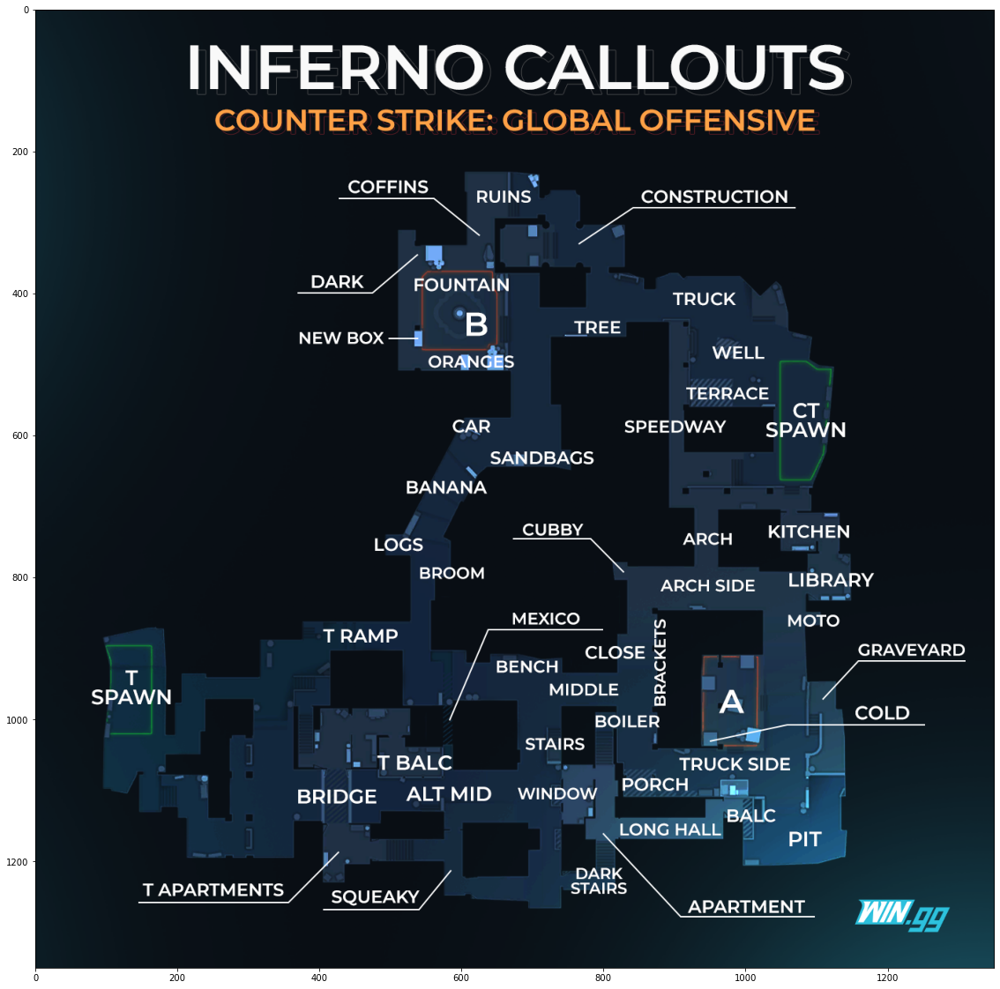

In [14]:
plt.figure(figsize=(20,20))
inferno_callouts = plt.imread('original.png')
plt.imshow(inferno_callouts)

In [15]:
from sklearn import neighbors
clf = neighbors.KNeighborsClassifier(100, weights = 'distance')
clf.fit(map_control[['x', 'y']],  map_control['z'])
xx, yy = np.meshgrid(np.arange(0,1024,1), np.arange(0,1024,1))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

In [16]:
t_control = map_control[map_control['side'] == 'Terrorist']
ct_control = map_control[map_control['side'] == 'CounterTerrorist']

Text(0.5, 1.0, 'de_inferno Early Map Control')

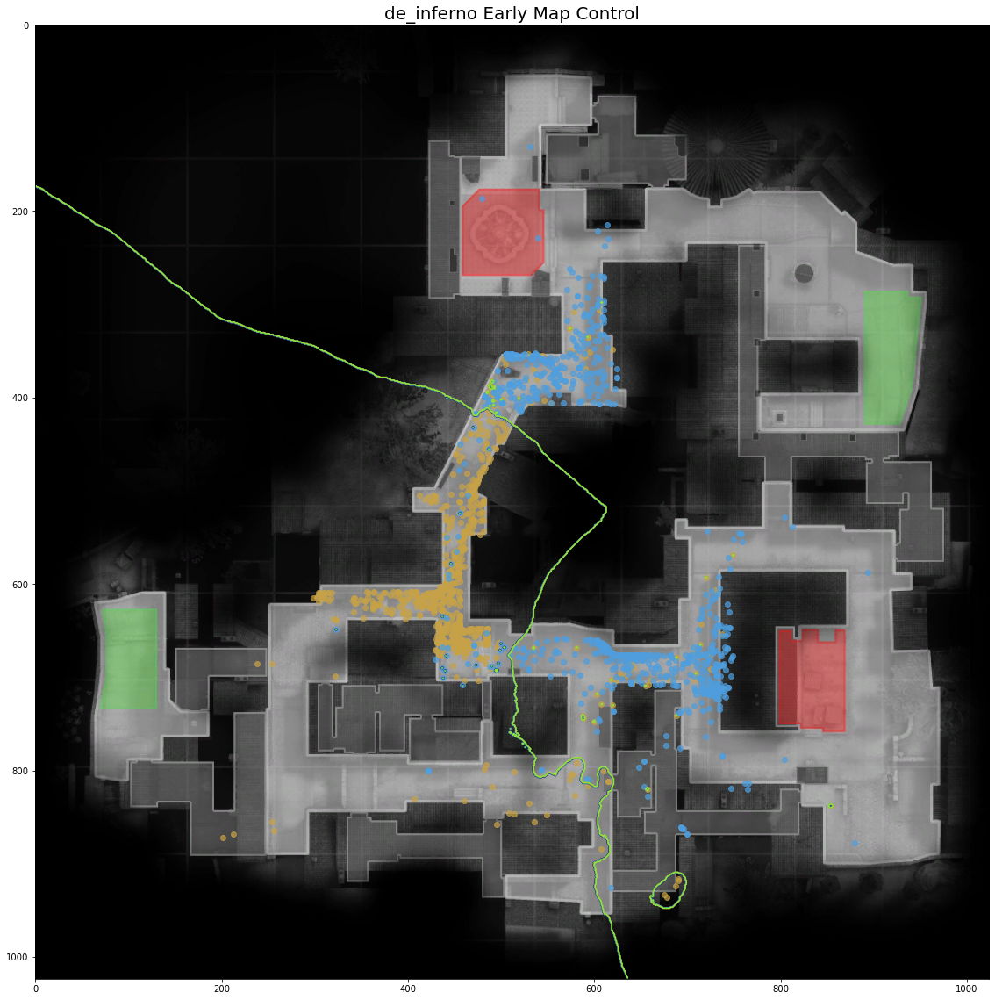

In [17]:
im_inf = plt.imread('de_inferno.png')
fig, ax1 = plt.subplots(1,1,figsize=(20,20))
plt.imshow(im_inf)
plt.scatter(t_control['x'], t_control['y'], alpha = 0.7, c = '#c7a247')
plt.scatter(ct_control['x'], ct_control['y'], alpha = 0.7, c = '#4f9ede')
ax1.contour(xx, yy, Z)
plt.title('de_inferno Early Map Control',fontsize = 20)

In [18]:
import warnings
warnings.filterwarnings('ignore')
def train_pointx_to_resolutionx(xinput,startX= -2436,endX=2262,resX= 1024):
    sizeX=endX-startX
    if startX < 0:
        xinput += startX *(-1.0)
    else:
        xinput += startX
    xoutput = float((xinput / abs(sizeX)) * resX);
    return xoutput

def train_pointy_to_resolutiony(yinput,startY= -2469,endY=2447,resY= 1024):
    sizeY=endY-startY
    if startY < 0:
        yinput += startY *(-1.0)
    else:
        yinput += startY
    youtput = float((yinput / abs(sizeY)) * resY);
    return resY-youtput

In [19]:
df_esea_train = df_esea_pos[(df_esea_pos['map'] == 'de_train') & (df_esea_pos['roundgroup'] == '2')]
df_esea_train['vic_map_x'] = df_esea_train['vic_pos_x'].apply(train_pointx_to_resolutionx)
df_esea_train['vic_map_y'] = df_esea_train['vic_pos_y'].apply(train_pointy_to_resolutiony)
df_esea_train['att_map_x'] = df_esea_train['att_pos_x'].apply(train_pointx_to_resolutionx)
df_esea_train['att_map_y'] = df_esea_train['att_pos_y'].apply(train_pointy_to_resolutiony)

In [20]:
train_map_control = pd.concat([df_esea_train[['att_side', 'att_map_x', 'att_map_y']].rename(columns={'att_side':'side', 'att_map_x':'x', 'att_map_y':'y'}),
               df_esea_train[['vic_side', 'vic_map_x', 'vic_map_y']].rename(columns={'vic_side':'side', 'vic_map_x':'x', 'vic_map_y':'y'})])
train_map_control['z'] = train_map_control['side'] == 'CounterTerrorist'
train_map_control

,side,x,y,z
8100,CounterTerrorist,731.362139,466.407941,True
8101,None,530.962963,509.708706,False
8102,Terrorist,432.318501,518.925464,False
10767,Terrorist,681.337080,168.220537,False
15659,CounterTerrorist,654.413160,532.894203,True
...,...,...,...,...
734527,CounterTerrorist,492.341380,528.485177,True
734528,Terrorist,410.180964,395.396458,False
734529,CounterTerrorist,510.034600,568.622722,True
737851,Terrorist,421.571776,691.562712,False


In [21]:
clftrain = neighbors.KNeighborsClassifier(100, weights = 'distance')
clftrain.fit(train_map_control[['x', 'y']],  train_map_control['z'])
ZTrain = clftrain.predict(np.c_[xx.ravel(), yy.ravel()])
ZTrain = ZTrain.reshape(xx.shape)

Text(0.5, 1.0, 'de_train Early Map Control')

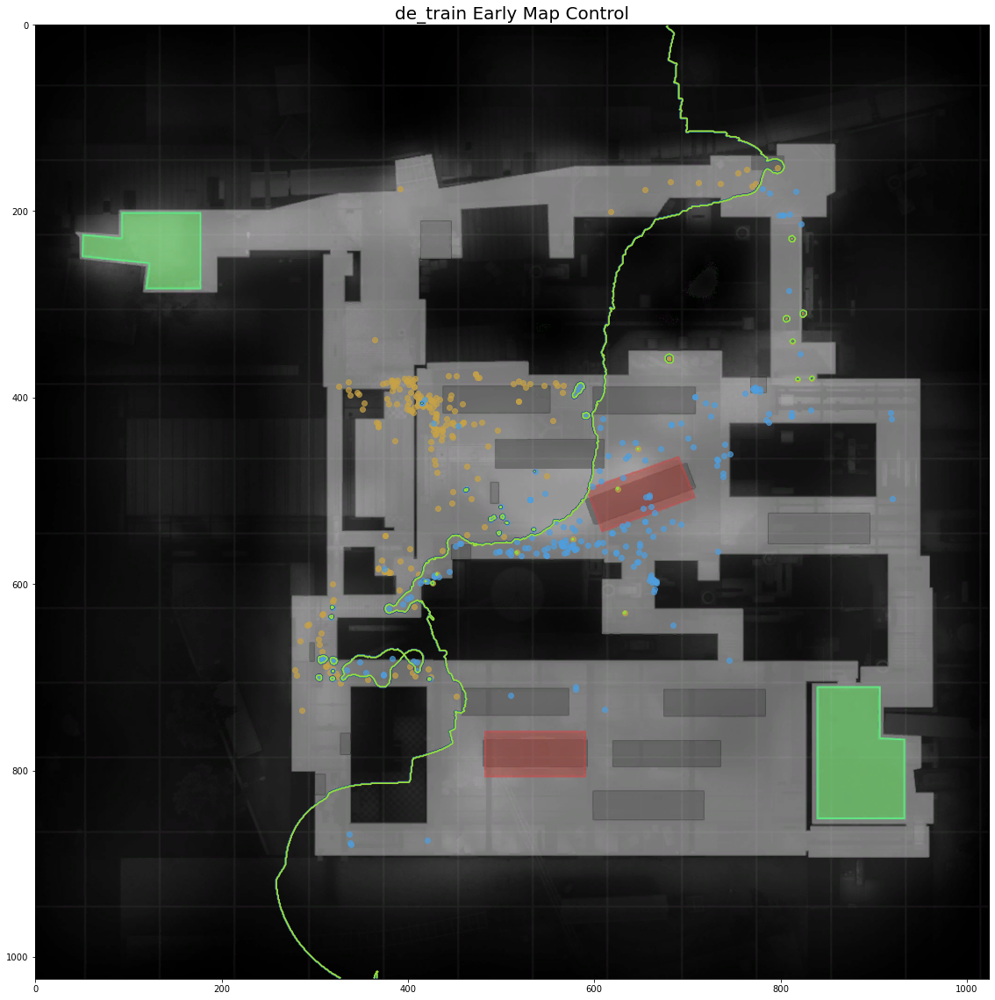

In [22]:
train_t_control = train_map_control[train_map_control['side'] == 'Terrorist']
train_ct_control = train_map_control[train_map_control['side'] == 'CounterTerrorist']
plt.figure(figsize=(20,20))
imtrain = plt.imread('de_train.png')
plt.imshow(imtrain)
plt.scatter(train_t_control['x'], train_t_control['y'], alpha = 0.7, c = '#c7a247')
plt.scatter(train_ct_control['x'], train_ct_control['y'], alpha = 0.7, c = '#4f9ede')
plt.contour(xx, yy, ZTrain)
plt.title('de_train Early Map Control',fontsize = 20)

In [23]:
import warnings
warnings.filterwarnings('ignore')
def mir_pointx_to_resolutionx(xinput,startX= -3217,endX=1912,resX= 1024):
    sizeX=endX-startX
    if startX < 0:
        xinput += startX *(-1.0)
    else:
        xinput += startX
    xoutput = float((xinput / abs(sizeX)) * resX);
    return xoutput

def mir_pointy_to_resolutiony(yinput,startY= -3401,endY=1682,resY= 1024):
    sizeY=endY-startY
    if startY < 0:
        yinput += startY *(-1.0)
    else:
        yinput += startY
    youtput = float((yinput / abs(sizeY)) * resY);
    return resY-youtput

In [24]:
df_esea_mirage = df_esea_pos[(df_esea_pos['map'] == 'de_mirage') & (df_esea_pos['roundgroup'] == '2')]
df_esea_mirage['vic_map_x'] = df_esea_mirage['vic_pos_x'].apply(mir_pointx_to_resolutionx)
df_esea_mirage['vic_map_y'] = df_esea_mirage['vic_pos_y'].apply(mir_pointy_to_resolutiony)
df_esea_mirage['att_map_x'] = df_esea_mirage['att_pos_x'].apply(mir_pointx_to_resolutionx)
df_esea_mirage['att_map_y'] = df_esea_mirage['att_pos_y'].apply(mir_pointy_to_resolutiony)

In [25]:
mir_map_control = pd.concat([df_esea_mirage[['att_side', 'att_map_x', 'att_map_y']].rename(columns={'att_side':'side', 'att_map_x':'x', 'att_map_y':'y'}),
               df_esea_mirage[['vic_side', 'vic_map_x', 'vic_map_y']].rename(columns={'vic_side':'side', 'vic_map_x':'x', 'vic_map_y':'y'})])
mir_map_control['z'] = mir_map_control['side'] == 'CounterTerrorist'
mir_t_control = mir_map_control[mir_map_control['side'] == 'Terrorist']
mir_ct_control = mir_map_control[mir_map_control['side'] == 'CounterTerrorist']

In [26]:
clfmir = neighbors.KNeighborsClassifier(100, weights = 'distance')
clfmir.fit(mir_map_control[['x', 'y']],  mir_map_control['z'])
ZMir = clfmir.predict(np.c_[xx.ravel(), yy.ravel()])
ZMir = ZMir.reshape(xx.shape)

Text(0.5, 1.0, 'de_mirage Early Map Control')

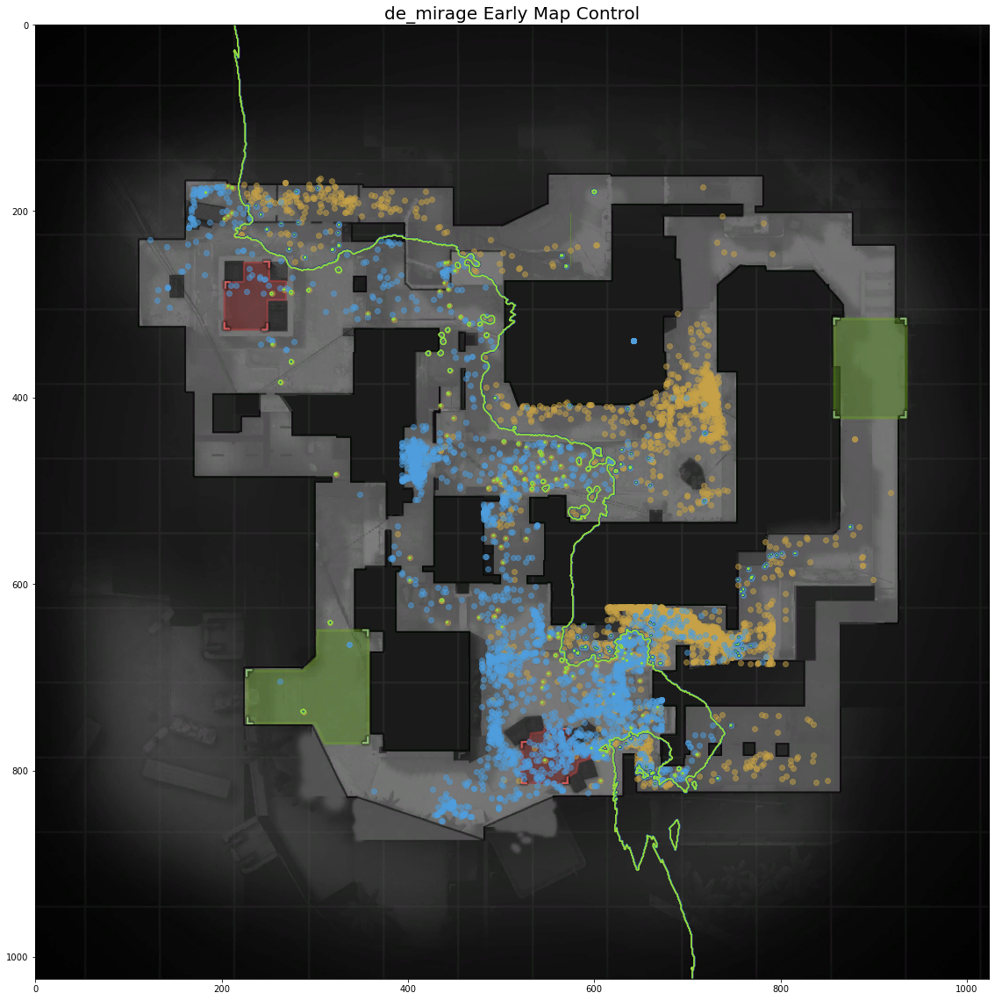

In [27]:
plt.figure(figsize=(20,20))
im_mir = plt.imread('de_mirage.png')
plt.imshow(im_mir)
plt.scatter(mir_t_control['x'], mir_t_control['y'], alpha = 0.5, c = '#c7a247')
plt.scatter(mir_ct_control['x'], mir_ct_control['y'], alpha = 0.5, c = '#4f9ede')
plt.contour(xx, yy, ZMir)
plt.title('de_mirage Early Map Control',fontsize = 20)

In [28]:
df_esea_inf_midround = df_esea_inf[df_esea_inf['roundgroup'] == '4']
df_esea_inf_midround

tick    seconds att_team vic_team  \
file                    round                                        
esea_match_13779790.dem 3       40299   314.6697   Team 2   Team 1   
                        3       40315   314.7949   Team 2   Team 1   
                        3       40935   319.6447   Team 1   Team 2   
                        3       40963   319.8637   Team 2   Team 1   
                        3       41033   320.4112   Team 2   Team 1   
...                               ...        ...      ...      ...   
esea_match_13829146.dem 18     204008  1593.5950   Team 2   Team 1   
                        18     204048  1593.9080   Team 1   Team 2   
                        18     204082  1594.1740   Team 2   Team 1   
                        18     204214  1595.2070   Team 1   Team 2   
                        18     204218  1595.2380   Team 2   Team 1   

                                       att_side          vic_side  hp_dmg  \
file                    round                                               
esea_match_13779790.dem 3             Terrorist  CounterTerrorist      71   
                        3             Terrorist  CounterTerrorist      29   
                        3      CounterTerrorist         Terrorist      58   
                        3             Terrorist  CounterTerrorist      34   
                        3             Terrorist  CounterTerrorist      13   
...                                         ...               ...     ...   
esea_match_13829146.dem 18     CounterTerrorist         Terrorist      21   
                        18            Terrorist  CounterTerrorist      80   
                        18     CounterTerrorist         Terrorist      58   
                        18            Terrorist  CounterTerrorist      26   
                        18     CounterTerrorist         Terrorist      18   

                               arm_dmg  is_bomb_planted bomb_site  ...  \
file                    round                                      ...   
esea_match_13779790.dem 3            0            False       NaN  ...   
                        3            0            False       NaN  ...   
                        3           28            False       NaN  ...   
                        3            0            False       NaN  ...   
                        3            0            False       NaN  ...   
...                                ...              ...       ...  ...   
esea_match_13829146.dem 18           0            False       NaN  ...   
                        18          22            False       NaN  ...   
                        18           0            False       NaN  ...   
                        18           7            False       NaN  ...   
                        18           0            False       NaN  ...   

                                      map start_seconds end_seconds  \
file                    round                                         
esea_match_13779790.dem 3      de_inferno      290.0456    338.8715   
                        3      de_inferno      290.0456    338.8715   
                        3      de_inferno      290.0456    338.8715   
                        3      de_inferno      290.0456    338.8715   
                        3      de_inferno      290.0456    338.8715   
...                                   ...           ...         ...   
esea_match_13829146.dem 18     de_inferno     1549.8990   1600.2600   
                        18     de_inferno     1549.8990   1600.2600   
                        18     de_inferno     1549.8990   1600.2600   
                        18     de_inferno     1549.8990   1600.2600   
                        18     de_inferno     1549.8990   1600.2600   

                               winner_team       winner_side  round_type  \
file                    round                                              
esea_match_13779790.dem 3           Team 2         Terrorist         ECO   
     

In [29]:
df_esea_inf_midround['vic_map_x'] = df_esea_inf_midround['vic_pos_x'].apply(pointx_to_resolutionx)
df_esea_inf_midround['vic_map_y'] = df_esea_inf_midround['vic_pos_y'].apply(pointy_to_resolutiony)
df_esea_inf_midround['att_map_x'] = df_esea_inf_midround['att_pos_x'].apply(pointx_to_resolutionx)
df_esea_inf_midround['att_map_y'] = df_esea_inf_midround['att_pos_y'].apply(pointy_to_resolutiony)
df_esea_inf_midround

tick    seconds att_team vic_team  \
file                    round                                        
esea_match_13779790.dem 3       40299   314.6697   Team 2   Team 1   
                        3       40315   314.7949   Team 2   Team 1   
                        3       40935   319.6447   Team 1   Team 2   
                        3       40963   319.8637   Team 2   Team 1   
                        3       41033   320.4112   Team 2   Team 1   
...                               ...        ...      ...      ...   
esea_match_13829146.dem 18     204008  1593.5950   Team 2   Team 1   
                        18     204048  1593.9080   Team 1   Team 2   
                        18     204082  1594.1740   Team 2   Team 1   
                        18     204214  1595.2070   Team 1   Team 2   
                        18     204218  1595.2380   Team 2   Team 1   

                                       att_side          vic_side  hp_dmg  \
file                    round                                               
esea_match_13779790.dem 3             Terrorist  CounterTerrorist      71   
                        3             Terrorist  CounterTerrorist      29   
                        3      CounterTerrorist         Terrorist      58   
                        3             Terrorist  CounterTerrorist      34   
                        3             Terrorist  CounterTerrorist      13   
...                                         ...               ...     ...   
esea_match_13829146.dem 18     CounterTerrorist         Terrorist      21   
                        18            Terrorist  CounterTerrorist      80   
                        18     CounterTerrorist         Terrorist      58   
                        18            Terrorist  CounterTerrorist      26   
                        18     CounterTerrorist         Terrorist      18   

                               arm_dmg  is_bomb_planted bomb_site  ...  \
file                    round                                      ...   
esea_match_13779790.dem 3            0            False       NaN  ...   
                        3            0            False       NaN  ...   
                        3           28            False       NaN  ...   
                        3            0            False       NaN  ...   
                        3            0            False       NaN  ...   
...                                ...              ...       ...  ...   
esea_match_13829146.dem 18           0            False       NaN  ...   
                        18          22            False       NaN  ...   
                        18           0            False       NaN  ...   
                        18           7            False       NaN  ...   
                        18           0            False       NaN  ...   

                                    winner_side round_type ct_eq_val  \
file                    round                                          
esea_match_13779790.dem 3             Terrorist        ECO      1000   
                        3             Terrorist        ECO      1000   
                        3             Terrorist        ECO      1000   
                        3             Terrorist        ECO      1000   
                        3             Terrorist        ECO      1000   
...                                         ...        ...       ...   
esea_match_13829146.dem 18     CounterTerrorist        ECO     21350   
                        18     CounterTerrorist        ECO     21350   
                        18     CounterTerrorist        ECO     21350   
                        18     CounterTerrorist        ECO     21350   
                        18     CounterTerrorist        ECO     21350   

                               t_eq_val  roundtime  roundgroup   vic_map_x  \
file                    round                                                
esea_match_13779790.dem 3         18200    48.8259           4  

In [30]:
ct_inf_m4a4 = df_esea_inf_midround[(df_esea_inf_midround.att_side == 'CounterTerrorist') & (df_esea_inf_midround.is_bomb_planted == False) & (df_esea_inf_midround.wp == 'M4A4')]
t_inf_ak47 = df_esea_inf_midround[(df_esea_inf_midround.att_side == 'Terrorist') & (df_esea_inf_midround.is_bomb_planted == False) & (df_esea_inf_midround.wp == 'AK47')]
ct_inf_m4a1 = df_esea_inf_midround[(df_esea_inf_midround.att_side == 'CounterTerrorist') & (df_esea_inf_midround.is_bomb_planted == False) & (df_esea_inf_midround.wp == 'M4A1')]
ct_inf_awp = df_esea_inf_midround[(df_esea_inf_midround.att_side == 'CounterTerrorist') & (df_esea_inf_midround.is_bomb_planted == False) & (df_esea_inf_midround.wp == 'AWP')]
t_inf_awp = df_esea_inf_midround[(df_esea_inf_midround.att_side == 'Terrorist') & (df_esea_inf_midround.is_bomb_planted == False) & (df_esea_inf_midround.wp == 'AWP')]
ct_inf_m4a4_m4a1 = pd.concat([ct_inf_m4a4,ct_inf_m4a1])

<AxesSubplot:xlabel='att_map_x', ylabel='att_map_y'>

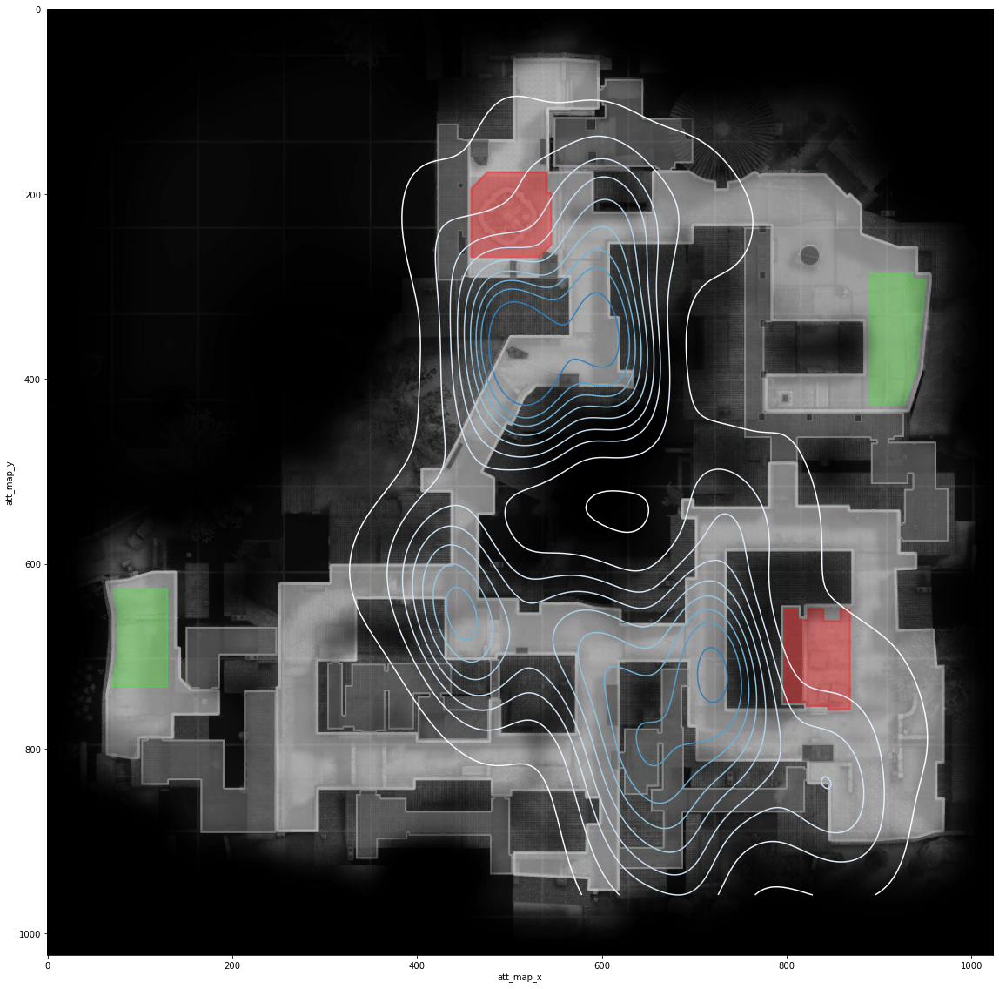

In [31]:
plt.figure(figsize=(20,20))
plt.imshow(im_inf)
sns.kdeplot(ct_inf_m4a4_m4a1['att_map_x'], ct_inf_m4a4_m4a1['att_map_y'], cmap='Blues', weights = ct_inf_m4a4_m4a1['hp_dmg'],cut = 0)

<AxesSubplot:xlabel='att_map_x', ylabel='att_map_y'>

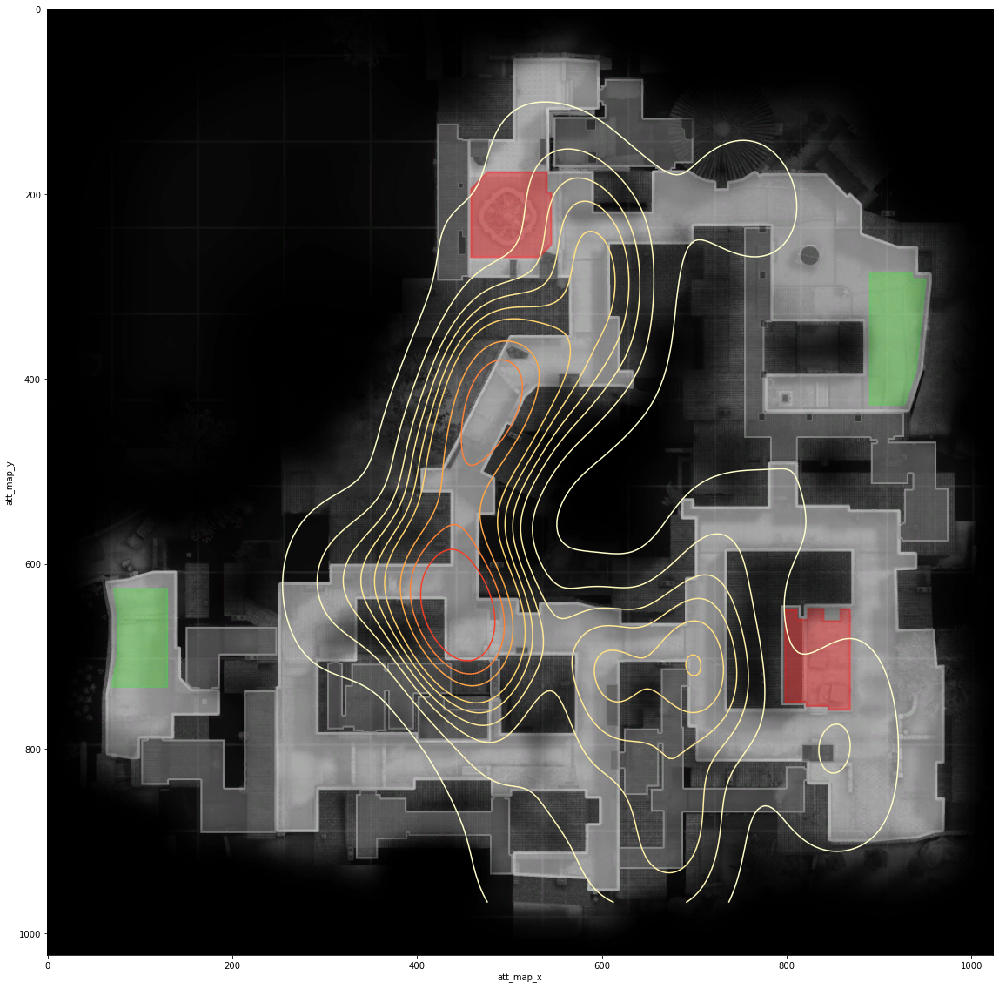

In [32]:
plt.figure(figsize=(20,20))
plt.imshow(im_inf)
sns.kdeplot(t_inf_ak47['att_map_x'], t_inf_ak47['att_map_y'], cmap='YlOrRd', weights = t_inf_ak47['hp_dmg'], cut = 0)

<AxesSubplot:xlabel='att_map_x', ylabel='att_map_y'>

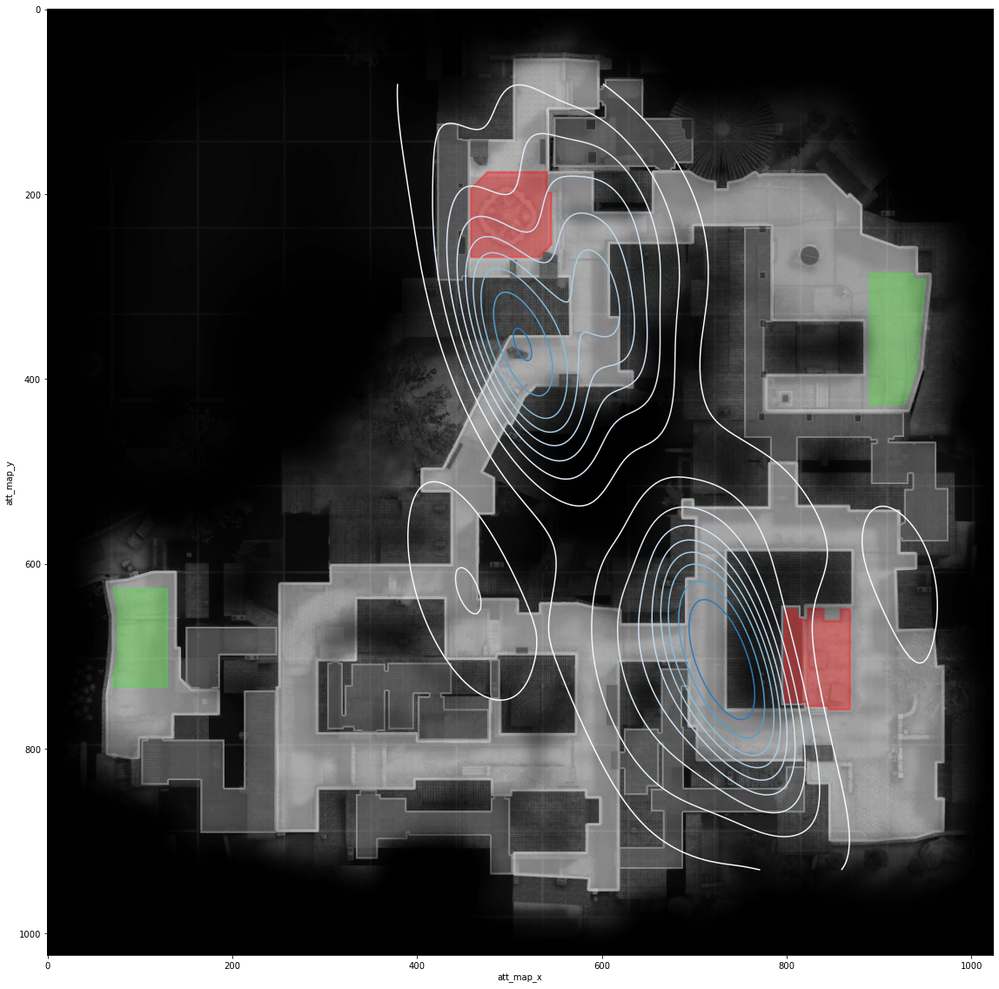

In [33]:
plt.figure(figsize=(20,20))
plt.imshow(im_inf)
sns.kdeplot(ct_inf_awp['att_map_x'], ct_inf_awp['att_map_y'], cmap='Blues', weights = ct_inf_awp['hp_dmg'],cut = 0)

<AxesSubplot:xlabel='att_map_x', ylabel='att_map_y'>

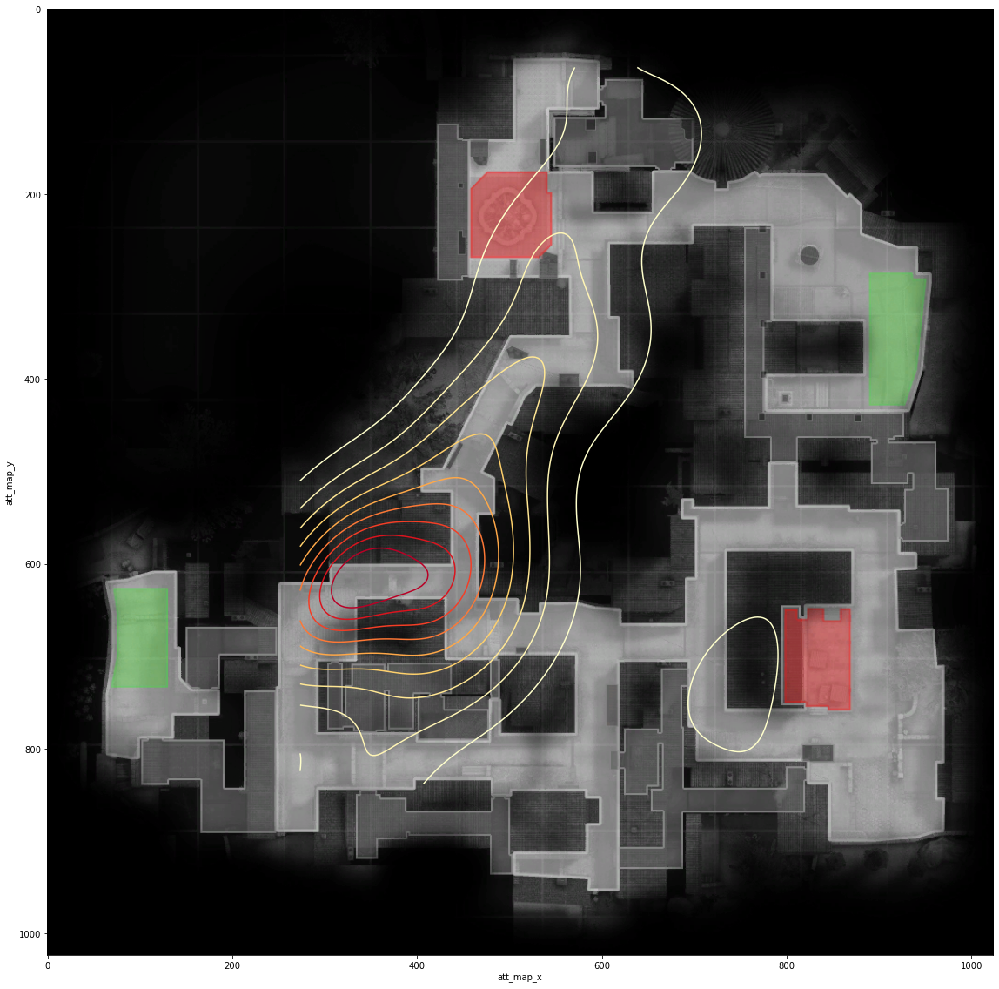

In [34]:
plt.figure(figsize=(20,20))
plt.imshow(im_inf)
sns.kdeplot(t_inf_awp['att_map_x'], t_inf_awp['att_map_y'], cmap='YlOrRd', weights = t_inf_awp['hp_dmg'],cut = 0)

In [35]:
from sklearn.cluster import KMeans
Kmeans_ct = KMeans(n_clusters=7, algorithm = 'elkan')
Kmeans_ct.fit(ct_inf_m4a4_m4a1[['att_map_x','att_map_y']])
ct_clusters = pd.DataFrame(Kmeans_ct.cluster_centers_)

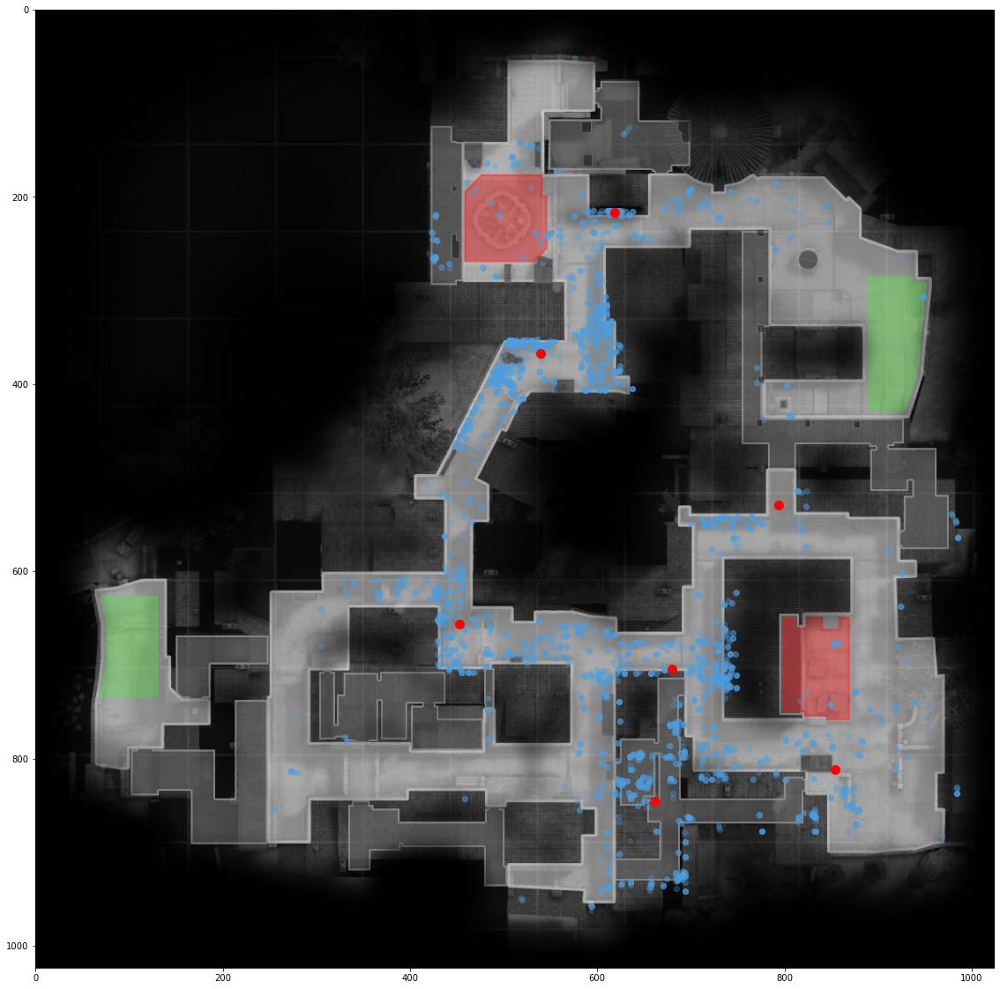

In [36]:
plt.figure(figsize=(20,20))
plt.imshow(im_inf)
plt.scatter(ct_inf_m4a4_m4a1['att_map_x'], ct_inf_m4a4_m4a1['att_map_y'], alpha = 0.3, c = '#4f9ede')
plt.scatter(ct_clusters[0],ct_clusters[1], color ='r',s=100)

In [37]:
Kmeans_t = KMeans(n_clusters=7, algorithm = 'elkan')
Kmeans_t.fit(t_inf_ak47[['att_map_x','att_map_y']])
t_clusters = pd.DataFrame(Kmeans_t.cluster_centers_)

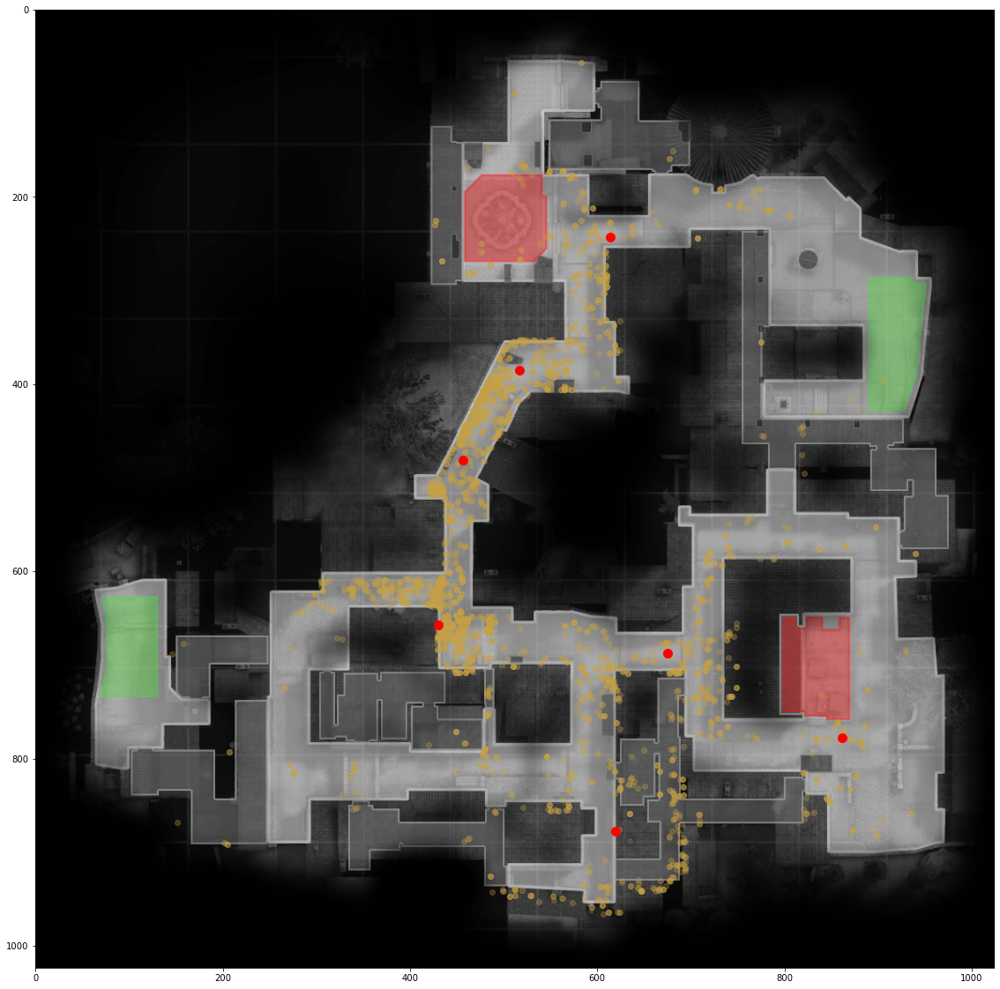

In [38]:
plt.figure(figsize=(20,20))
plt.imshow(im_inf)
plt.scatter(t_inf_ak47['att_map_x'], t_inf_ak47['att_map_y'], alpha = 0.3, c = '#c7a247')
plt.scatter(t_clusters[0],t_clusters[1], color ='r', s= 100)

In [39]:
Kmeans_ct_awp = KMeans(n_clusters=3, algorithm = 'elkan', n_init = 100)
Kmeans_ct_awp.fit(ct_inf_awp[['att_map_x','att_map_y']])
ct_awp_clusters = pd.DataFrame(Kmeans_ct_awp.cluster_centers_)

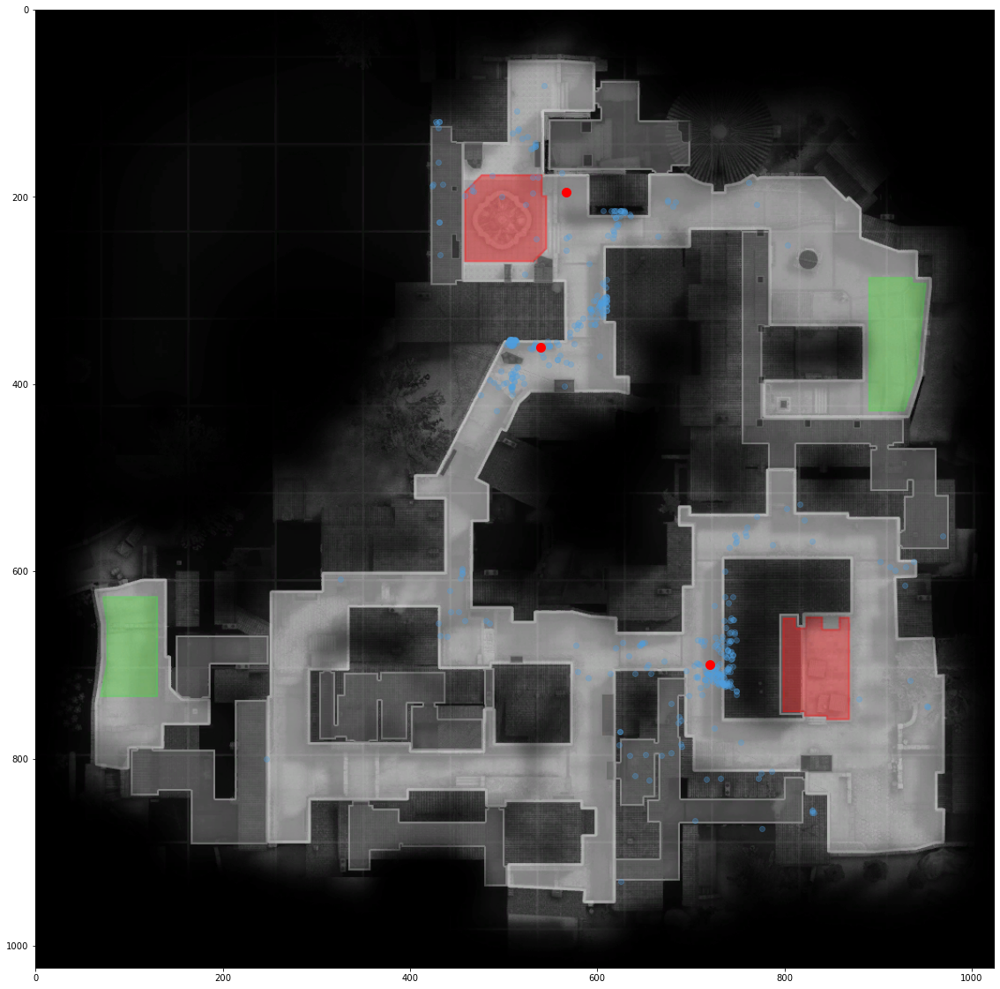

In [40]:
plt.figure(figsize=(20,20))
plt.imshow(im_inf)
plt.scatter(ct_inf_awp['att_map_x'], ct_inf_awp['att_map_y'], alpha = 0.3, c = '#4f9ede')
plt.scatter(ct_awp_clusters[0],ct_awp_clusters[1], color ='r',s=100)

In [41]:
df_nades = pd.read_csv('mm_grenades_demos.csv')
df_nades_inf = df_nades[df_nades['map'] == 'de_inferno']
df_nades_inf.dtypes

Unnamed: 0           int64
file                object
map                 object
round                int64
start_seconds      float64
seconds            float64
end_seconds        float64
att_team            object
vic_team            object
att_id               int64
vic_id             float64
att_side            object
vic_side            object
hp_dmg               int64
arm_dmg              int64
is_bomb_planted       bool
bomb_site           object
hitbox              object
nade                object
winner_team         object
winner_side         object
att_rank             int64
vic_rank           float64
att_pos_x          float64
att_pos_y          float64
nade_land_x        float64
nade_land_y        float64
vic_pos_x          float64
vic_pos_y          float64
round_type          object
ct_eq_val            int64
t_eq_val             int64
avg_match_rank     float64
dtype: object

In [42]:
df_nades_inf['vic_map_x'] = df_nades_inf['vic_pos_x'].apply(pointx_to_resolutionx)
df_nades_inf['vic_map_y'] = df_nades_inf['vic_pos_y'].apply(pointy_to_resolutiony)
df_nades_inf['att_map_x'] = df_nades_inf['att_pos_x'].apply(pointx_to_resolutionx)
df_nades_inf['att_map_y'] = df_nades_inf['att_pos_y'].apply(pointy_to_resolutiony)
df_nades_inf['nade_map_x'] = df_nades_inf['nade_land_x'].apply(pointx_to_resolutionx)
df_nades_inf['nade_map_y'] = df_nades_inf['nade_land_y'].apply(pointy_to_resolutiony)

In [43]:
ct_molly_inf = df_nades_inf[(df_nades_inf['nade'] == 'Incendiary') & (df_nades_inf['att_side'] == 'CounterTerrorist') & (df_nades_inf['avg_match_rank'] > 11) ]
t_molly_inf = df_nades_inf[(df_nades_inf['nade'] == 'Molotov') & (df_nades_inf['att_side'] == 'Terrorist') & (df_nades_inf['avg_match_rank'] > 11)]
ct_smoke_inf = df_nades_inf[(df_nades_inf['nade'] == 'Smoke') & (df_nades_inf['att_side'] == 'CounterTerrorist') & (df_nades_inf['avg_match_rank'] > 11)]
t_smoke_inf = df_nades_inf[(df_nades_inf['nade'] == 'Smoke') & (df_nades_inf['att_side'] == 'Terrorist') & (df_nades_inf['avg_match_rank'] > 11)]

<AxesSubplot:xlabel='nade_map_x', ylabel='nade_map_y'>

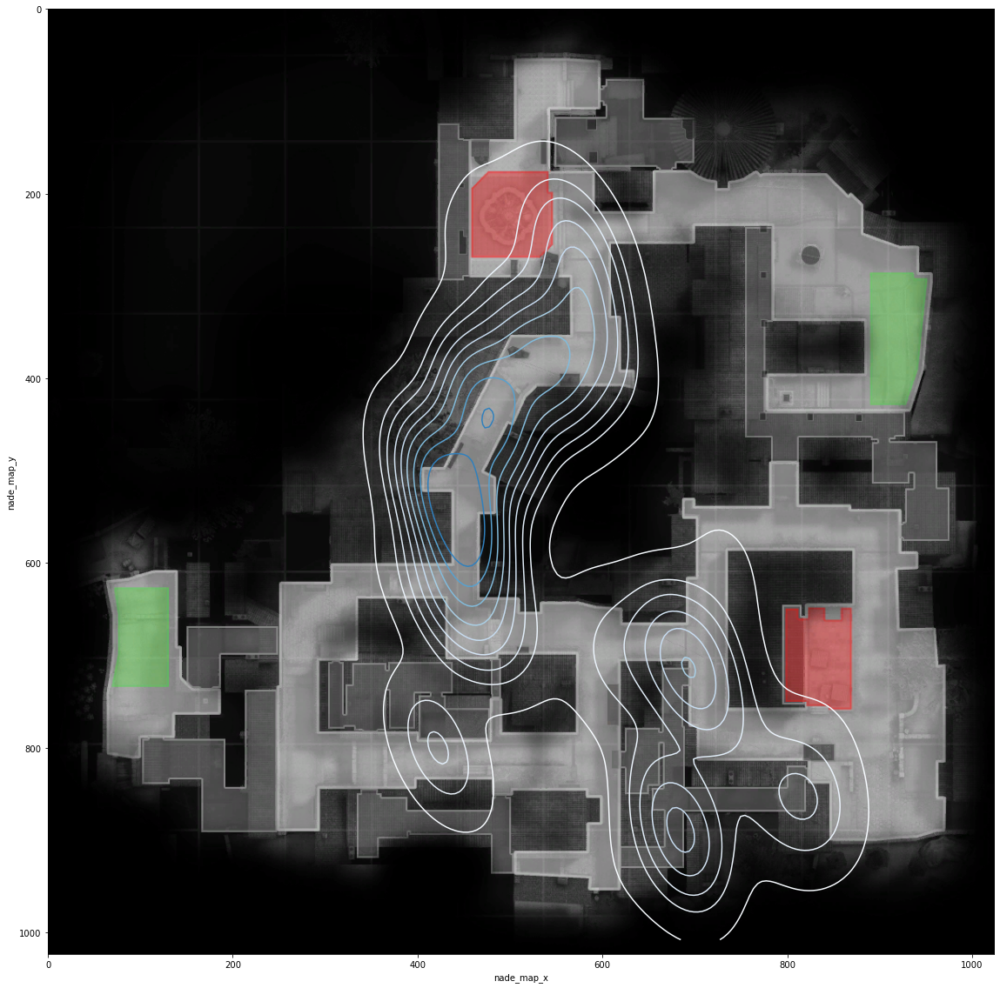

In [44]:
plt.figure(figsize=(20,20))
plt.imshow(im_inf)
sns.kdeplot(ct_molly_inf['nade_map_x'], ct_molly_inf['nade_map_y'], cmap='Blues', cut = 0)

<AxesSubplot:xlabel='nade_map_x', ylabel='nade_map_y'>

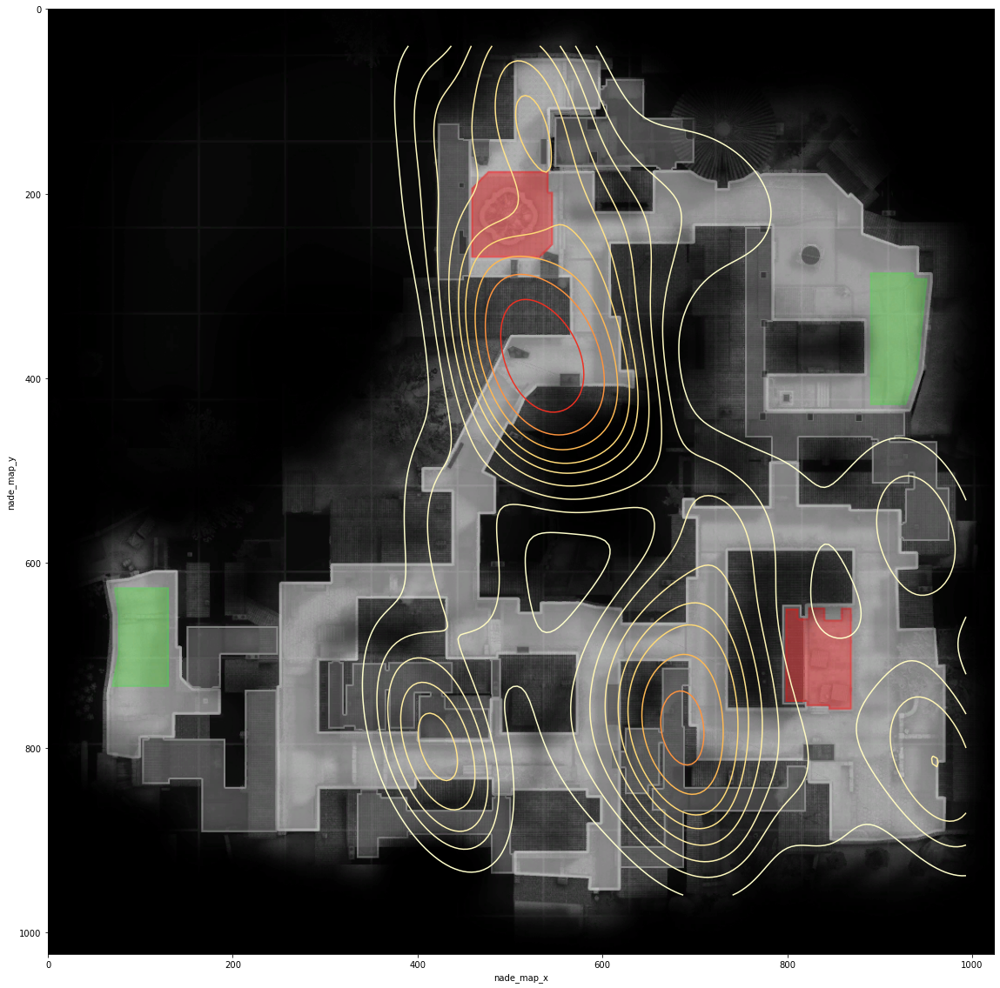

In [45]:
plt.figure(figsize=(20,20))
plt.imshow(im_inf)
sns.kdeplot(t_molly_inf['nade_map_x'], t_molly_inf['nade_map_y'], cmap='YlOrRd' , cut = 0)

In [59]:
Kmeans_t_smoke = KMeans(n_clusters=2, algorithm = 'elkan', n_init = 100)
Kmeans_t_smoke.fit(t_smoke_inf[['nade_map_x','nade_map_y']])
t_smoke_clusters = pd.DataFrame(Kmeans_t_smoke.cluster_centers_)

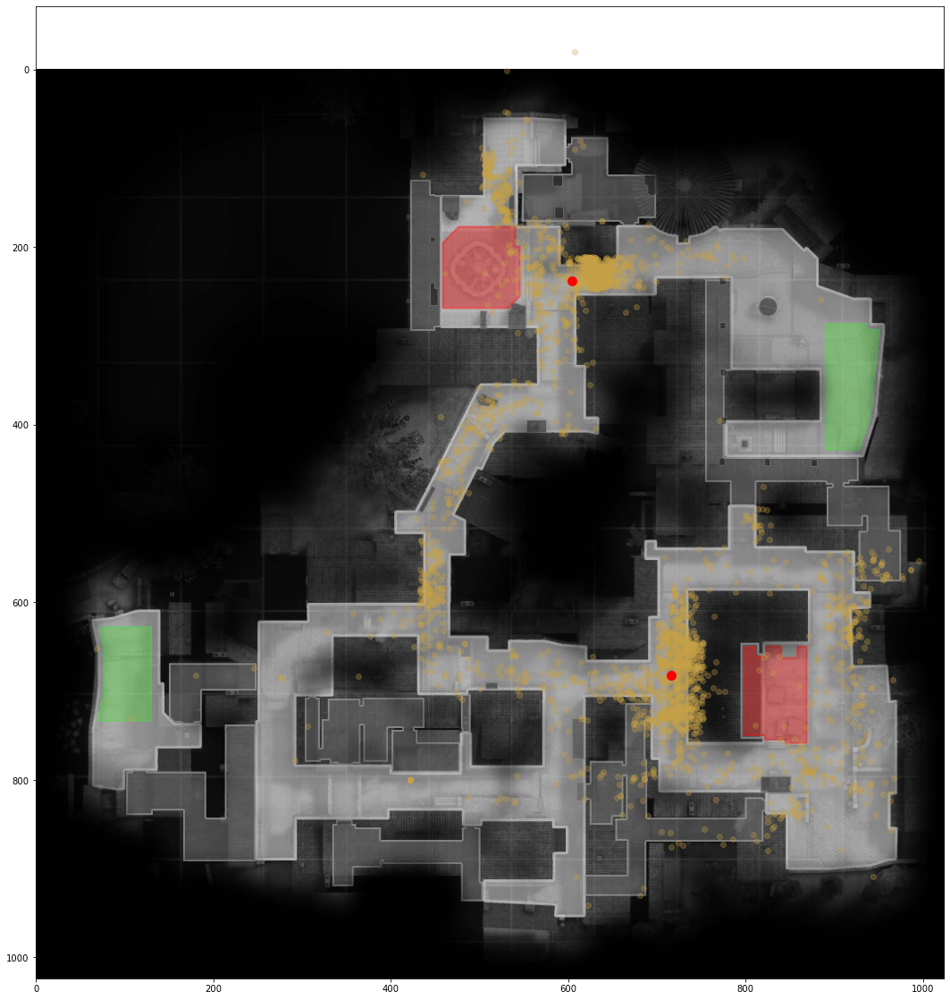

In [60]:
plt.figure(figsize=(20,20))
plt.imshow(im_inf)
plt.scatter(t_smoke_inf['nade_map_x'], t_smoke_inf['nade_map_y'], alpha = 0.3, c = '#c7a247')
plt.scatter(t_smoke_clusters[0],t_smoke_clusters[1], color ='r', s= 100)